In [18]:
# import library

%matplotlib inline

from pathlib import Path

import pandas as pd
import numpy as np
import pydotplus
from IPython.display import Image  
import matplotlib.pylab as plt
from sklearn.tree import export_graphviz
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn import metrics 
from sklearn.externals.six import StringIO  
from sklearn.linear_model import LinearRegression
import sys
!{sys.executable} -m pip install dmba
from dmba import plotDecisionTree, classificationSummary, regressionSummary, exhaustive_search
from dmba import adjusted_r2_score, AIC_score, BIC_score


In [19]:
from google.colab import files
uploaded = files.upload()

Saving cleaned_churn.csv to cleaned_churn (1).csv


In [20]:
ch_df = pd.read_csv('cleaned_churn.csv', index_col=0)

ch_df.head(5)

,COLLEGE,INCOME,OVERAGE,LEFTOVER,HOUSE,HANDSET_PRICE,OVER_15MINS_CALLS_PER_MONTH,AVERAGE_CALL_DURATION,REPORTED_SATISFACTION,REPORTED_USAGE_LEVEL,CONSIDERING_CHANGE_OF_PLAN,LEAVE
0,0,31953,0,6,313378,161,0,4,2,2,5,1
1,1,36147,0,13,800586,244,0,6,2,2,2,1
2,1,27273,230,0,305049,201,16,15,2,1,3,1
3,0,120070,38,33,788235,780,3,2,2,5,2,0
4,1,29215,208,85,224784,241,21,1,1,2,4,1


In [5]:
print(ch_df.columns)
ch_df.shape

Index(['COLLEGE', 'INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION',
       'REPORTED_SATISFACTION', 'REPORTED_USAGE_LEVEL',
       'CONSIDERING_CHANGE_OF_PLAN', 'LEAVE'],
      dtype='object')


(20000, 12)

# **USE 1) CORRELATION TABLE AND 2)R SQUARE (EXHAUSTIVE SEARCH) TO FIND THE BEST PREDICTOR SUBSETS**

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


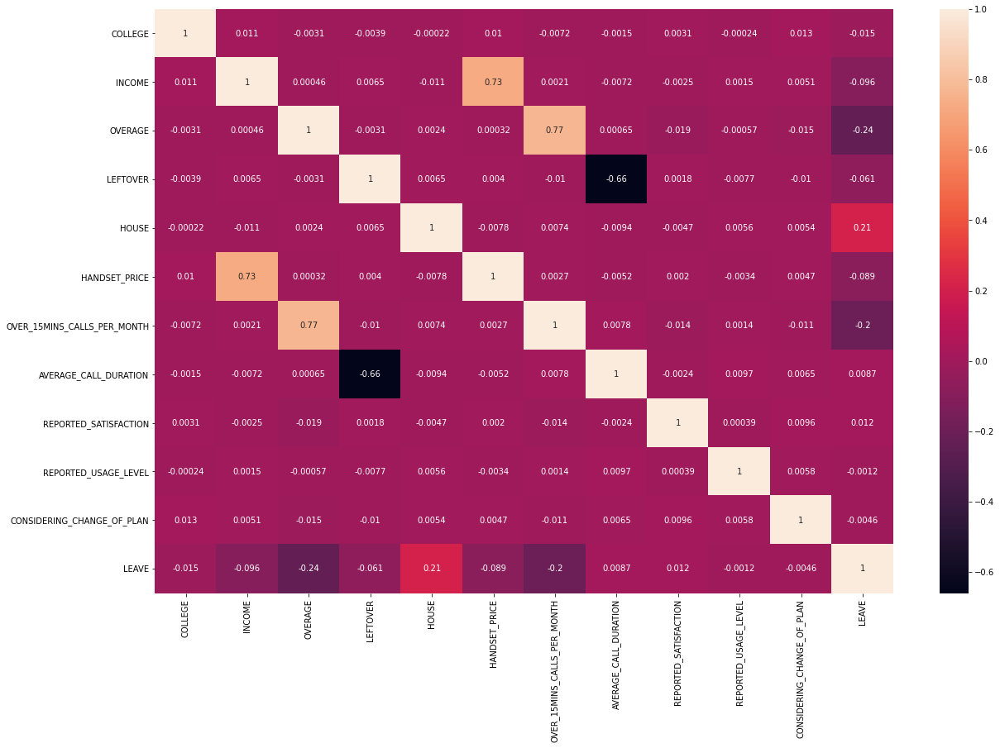

In [11]:
corr_table = ch_df.corr()

import seaborn as sn
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(20,13))
sn.heatmap(corr_table, annot=True)
plt.show()

# **exhaustive search**

In [0]:
# select outcome and predictor variables
predictors = ['COLLEGE', 'INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION',
       'REPORTED_SATISFACTION', 'REPORTED_USAGE_LEVEL',
       'CONSIDERING_CHANGE_OF_PLAN']
outcome = 'LEAVE'

# partition data
X = ch_df[predictors]
y = ch_df[outcome]
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

In [20]:
# exhaustive search

def train_model(variables):
    model = LinearRegression()
    model.fit(train_X[variables], train_y)
    return model

def score_model(model, variables):
    pred_y = model.predict(train_X[variables])
    # we negate as score is optimized to be as low as possible
    return -adjusted_r2_score(train_y, pred_y, model)

allVariables = train_X.columns
results = exhaustive_search(allVariables, train_model, score_model)

data = []
for result in results:
    model = result['model']
    variables = result['variables']
    AIC = AIC_score(train_y, model.predict(train_X[variables]), model)
    
    d = {'n': result['n'], 'r2adj': -result['score'], 'AIC': AIC}
    d.update({var: var in result['variables'] for var in allVariables})
    data.append(d)
pd.set_option('display.width', 100)
print(pd.DataFrame(data, columns=('n', 'r2adj', 'AIC') + tuple(sorted(allVariables))))
pd.reset_option('display.width')

     n     r2adj  ...  REPORTED_SATISFACTION  REPORTED_USAGE_LEVEL
0    1  0.057685  ...                  False                 False
1    2  0.102201  ...                  False                 False
2    3  0.110948  ...                  False                 False
3    4  0.114024  ...                  False                 False
4    5  0.115345  ...                  False                 False
5    6  0.116409  ...                  False                 False
6    7  0.117078  ...                  False                 False
7    8  0.117259  ...                  False                 False
8    9  0.117371  ...                   True                 False
9   10  0.117346  ...                   True                 False
10  11  0.117289  ...                   True                  True

[11 rows x 14 columns]


# **1. Decision tree classification**

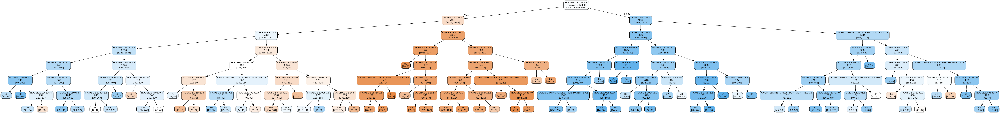

In [53]:
# drop columns that have correlations far smaller than others
classi_df = ch_df.drop(columns=['REPORTED_USAGE_LEVEL',
                               'AVERAGE_CALL_DURATION',
                               'REPORTED_SATISFACTION',
                               'COLLEGE',
                               'LEFTOVER', 
                               'INCOME',
                               'HANDSET_PRICE',  
                               'CONSIDERING_CHANGE_OF_PLAN'])

X = classi_df.drop(columns=['LEAVE'])
y = classi_df['LEAVE']
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

fullClassTree = DecisionTreeClassifier(random_state=0, min_samples_leaf=50, max_depth=7)
fullClassTree.fit(train_X, train_y)

plotDecisionTree(fullClassTree, feature_names=train_X.columns)

# Measuring model

In [54]:
classificationSummary(train_y, fullClassTree.predict(train_X))
classificationSummary(valid_y, fullClassTree.predict(valid_X))

Confusion Matrix (Accuracy 0.6672)

       Prediction
Actual    0    1
     0 3545 2374
     1 1620 4461
Confusion Matrix (Accuracy 0.6334)

       Prediction
Actual    0    1
     0 2226 1707
     1 1226 2841


**Training accuracy is not desired.**

# **2. random forest classification**

In [42]:
"""
predictors = ['COLLEGE', 'INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION',
       'REPORTED_SATISFACTION', 'REPORTED_USAGE_LEVEL',
       'CONSIDERING_CHANGE_OF_PLAN']
outcome = 'LEAVE'
"""


"\npredictors = ['COLLEGE', 'INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',\n       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION',\n       'REPORTED_SATISFACTION', 'REPORTED_USAGE_LEVEL',\n       'CONSIDERING_CHANGE_OF_PLAN']\noutcome = 'LEAVE'\n"

# Find subset predictors using random forest classifier

                        feature  importance       std
0                       COLLEGE    0.020090  0.001767
8         REPORTED_SATISFACTION    0.037052  0.003053
10   CONSIDERING_CHANGE_OF_PLAN    0.041814  0.005474
9          REPORTED_USAGE_LEVEL    0.044223  0.001561
7         AVERAGE_CALL_DURATION    0.063079  0.010944
6   OVER_15MINS_CALLS_PER_MONTH    0.068531  0.015767
3                      LEFTOVER    0.087651  0.007198
5                 HANDSET_PRICE    0.126730  0.007913
2                       OVERAGE    0.134529  0.008337
1                        INCOME    0.154169  0.012451
4                         HOUSE    0.222132  0.014985


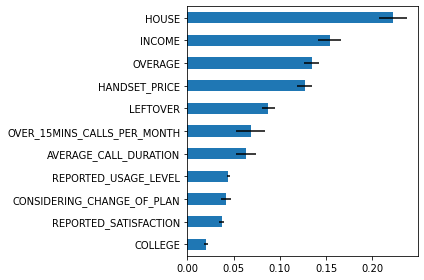

In [40]:
predictors = ['COLLEGE', 'INCOME', 'OVERAGE', 'LEFTOVER', 'HOUSE', 'HANDSET_PRICE',
       'OVER_15MINS_CALLS_PER_MONTH', 'AVERAGE_CALL_DURATION',
       'REPORTED_SATISFACTION', 'REPORTED_USAGE_LEVEL',
       'CONSIDERING_CHANGE_OF_PLAN']
outcome = 'LEAVE'


X = ch_df[predictors]
y = ch_df[outcome]
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

rf = RandomForestClassifier(n_estimators=5, random_state=1)
rf.fit(train_X, train_y)



# importance
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

df = pd.DataFrame({'feature': train_X.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance')
print(df)

ax = df.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')

plt.tight_layout()
plt.show()

# Use only 'INCOME', 'OVERAGE', 'HOUSE', 'HANDSET_PRICE' as predictors

In [0]:
predictors = ['INCOME', 'OVERAGE', 'HOUSE', 'HANDSET_PRICE']
outcome = 'LEAVE'

In [49]:
# partition data
X = ch_df[predictors]
y = ch_df[outcome]

train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

rf = RandomForestClassifier(n_estimators=5, random_state=1)
rf.fit(train_X, train_y)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=5,
                       n_jobs=None, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)

In [50]:
rf.estimators_[0]

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1791095845, splitter='best')

In [36]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO 
from IPython.display import Image
from sklearn import tree
import pydotplus # installing pyparsing maybe needed
from pydotplus import graphviz

dot_data = tree.export_graphviz(
        rf.estimators_[0],
        out_file=None,
        feature_names=predictors,
        class_names=outcome,
        rounded=True,
        proportion=False,
        precision=2,
        filled=True)
 
graph = pydotplus.graph_from_dot_data(dot_data) 
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.342525 to fit



# Measuring model: 1)importance of features

         feature  importance       std
1        OVERAGE    0.178765  0.012968
3  HANDSET_PRICE    0.231635  0.007808
0         INCOME    0.266477  0.018177
2          HOUSE    0.323122  0.003591


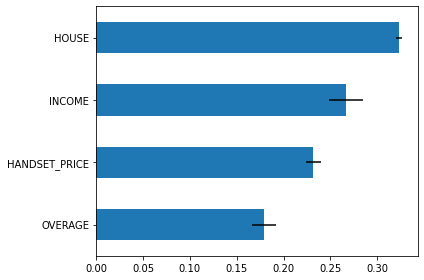

In [51]:
# importance
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

df = pd.DataFrame({'feature': train_X.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance')
print(df)

ax = df.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')

plt.tight_layout()
plt.show()

# 2)confusion matrix

In [52]:
classificationSummary(valid_y, rf.predict(valid_X))

Confusion Matrix (Accuracy 0.6305)

       Prediction
Actual    0    1
     0 2459 1474
     1 1482 2585


**Training Accuracy is not desired, and even lower than that of decision tree classification**